In [1]:
%load_ext autoreload
%autoreload 2
import os
import sys
from pathlib import Path
import joblib

project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))

In [2]:
from src.Bayesian import *
from src.Bayesian.problems.config import config_fgt
from src.Bayesian.problems import *
from src.Bayesian.utils.optimizer import Optimizer, ConstantDict
from src.Bayesian.utils.evaluator import ModelEval

In [3]:
from src.Bayesian.problems.fit_config import window_size_configs

from src.Bayesian.problems.fit_config import module_configs_M7
module_configs = {}

optimizer = Optimizer(module_configs, n_jobs=120)
subsect_ids = list(range(1, 25)) 

processed_path = Path(project_root) / 'data' / 'exp123' / 'processed'
optimizer.prepare_data(processed_path / 'Task2_processed.csv')

In [4]:
iSub = 13
training_results = optimizer.optimize_params_with_subs_parallel(
    config_fgt, [iSub], 16, 5, 1000, stop_at=0.8)

Processing tasks:   0%|                                                       | 0/1 [00:00<?, ?it/s]

(19,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)
(1,)

Processing tasks: 100%|██████████████████████████████████████████████| 1/1 [02:08<00:00, 128.75s/it]


(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)
(205,)


Computing error for params:   0%|          | 0/1000 [00:00<?, ?it/s]c:\Users\Ran\.conda\envs\cate_learn\Lib\site-packages\joblib\externals\loky\process_executor.py:1105: UserWarning: On Windows, max_workers cannot exceed 61 due to limitations of the operating system.
  warnings.warn(
Computing error for params:  24%|██▍       | 240/1000 [00:38<02:20,  5.41it/s]

KeyboardInterrupt: 

In [ ]:
# save results
result_path = Path(project_root) / 'results' / 'Model_results'
os.makedirs(result_path, exist_ok=True)

optimizer.save_results(training_results, 'M7_PMH_training', result_path)

### ----

In [ ]:
result_path = Path(project_root) / 'results' / 'Model_results_trainingtest' 
training_results = joblib.load(result_path / f'M7_PMH_training.joblib')

In [ ]:
test_results = optimizer.on_policy_with_subs_parallel(training_results,
    config_fgt, list(range(1, 25)), window_size_configs, 500)

In [ ]:
test_results = optimizer.on_policy_with_subs_parallel(training_results,
    config_fgt, list(range(1, 25)), window_size_configs, 10)

Computing error for params: 100%|██████████| 10/10 [00:00<00:00, 13560.63it/s]


In [ ]:
optimizer.save_results(test_results, 'M7_PMH_test_2', result_path)

In [ ]:
sub_testresults = test_results[1]

# 检查 'on_policy_choice' 和 'decision_distribution' 字段
for idx, step in enumerate(sub_testresults['best_step_results']):
    ground_truth = step.get('ground_truth')
    subject_choice = step.get('subject_choice')
    on_policy_choice = step.get('on_policy_choice')
    decision_distribution = step.get('decision_distribution')
    on_policy_response = step.get('on_policy_response')
    print(
        f"Step {idx}: ground_truth={ground_truth}, subject_choice={subject_choice}, on_policy_choice={on_policy_choice}, decision_distribution={decision_distribution}, on_policy_response={on_policy_response}"
    )

Step 0: ground_truth=2, subject_choice=1, on_policy_choice=1, decision_distribution=[0.9980293150730762, 0.001970684926923961], on_policy_response=1.0
Step 1: ground_truth=1, subject_choice=1, on_policy_choice=1, decision_distribution=[0.9873459438420014, 0.012654056157998368], on_policy_response=1.0
Step 2: ground_truth=3, subject_choice=2, on_policy_choice=2, decision_distribution=[0.0002523912500836176, 0.9997476087499165], on_policy_response=1.0
Step 3: ground_truth=1, subject_choice=1, on_policy_choice=1, decision_distribution=[0.9987233440250675, 0.0012766559749326364], on_policy_response=1.0
Step 4: ground_truth=3, subject_choice=2, on_policy_choice=2, decision_distribution=[0.0016893232576778504, 0.9983106767423222], on_policy_response=1.0
Step 5: ground_truth=3, subject_choice=2, on_policy_choice=2, decision_distribution=[0.0013436230215694742, 0.9986563769784306], on_policy_response=1.0
Step 6: ground_truth=1, subject_choice=1, on_policy_choice=1, decision_distribution=[0.994

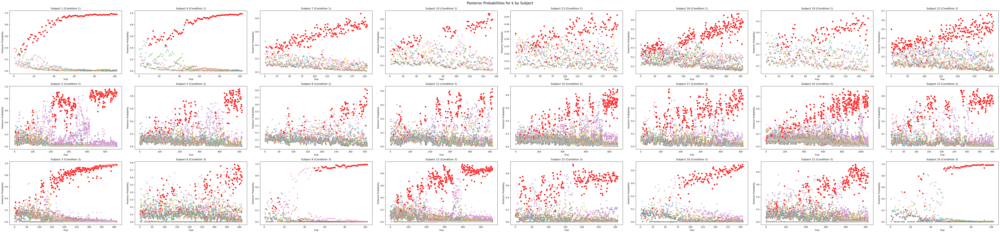

In [ ]:
model_eval = ModelEval()
model_eval.plot_posterior_probabilities(training_results, list(range(1, 25)))

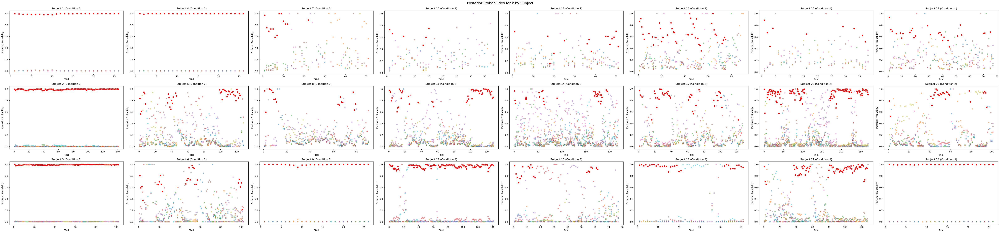

In [ ]:
model_eval.plot_posterior_probabilities(test_results, list(range(1, 25)))

In [ ]:
from src.Bayesian.utils.streaming import StreamList

In [ ]:
accuracies = {}

for iSub in range(1, 25):
    path, n = test_results[iSub]["raw_step_results"]
    trajs = StreamList(Path(path), n)

    acc_list = []
    for traj in trajs:
        model_choices = np.array([step["on_policy_choice"] for step in traj])
        subject_choices = np.array([step["subject_choice"] for step in traj])
        acc = (model_choices == subject_choices).mean()
        acc_list.append(acc)

    accuracies[iSub] = np.mean(acc_list)

# 打印预测准确率
for iSub, acc in accuracies.items():
    print(f"Subject {iSub}: Prediction Accuracy = {acc:.3f}")

Subject 1: Prediction Accuracy = 0.950
Subject 2: Prediction Accuracy = 0.699
Subject 3: Prediction Accuracy = 0.829
Subject 4: Prediction Accuracy = 0.931
Subject 5: Prediction Accuracy = 0.522
Subject 6: Prediction Accuracy = 0.422
Subject 7: Prediction Accuracy = 0.708
Subject 8: Prediction Accuracy = 0.489
Subject 9: Prediction Accuracy = 0.758
Subject 10: Prediction Accuracy = 0.711
Subject 11: Prediction Accuracy = 0.486
Subject 12: Prediction Accuracy = 0.709
Subject 13: Prediction Accuracy = 0.665
Subject 14: Prediction Accuracy = 0.482
Subject 15: Prediction Accuracy = 0.571
Subject 16: Prediction Accuracy = 0.703
Subject 17: Prediction Accuracy = 0.517
Subject 18: Prediction Accuracy = 0.620
Subject 19: Prediction Accuracy = 0.676
Subject 20: Prediction Accuracy = 0.519
Subject 21: Prediction Accuracy = 0.516
Subject 22: Prediction Accuracy = 0.677
Subject 23: Prediction Accuracy = 0.531
Subject 24: Prediction Accuracy = 0.769


In [ ]:
import numpy as np

# 按照iSub分组
condition1_subs = [1, 4, 7, 10, 13, 16, 19, 22]
condition2_subs = [2, 5, 8, 11, 14, 17, 20, 23]
condition3_subs = [3, 6, 9, 12, 15, 18, 21, 24]

# 获取每组的准确率
acc1 = [accuracies[i] for i in condition1_subs]
acc2 = [accuracies[i] for i in condition2_subs]
acc3 = [accuracies[i] for i in condition3_subs]

# 计算均值和标准差
mean1, std1 = np.mean(acc1), np.std(acc1)
mean2, std2 = np.mean(acc2), np.std(acc2)
mean3, std3 = np.mean(acc3), np.std(acc3)

print(f"Condition 1: Mean={mean1:.3f}, Std={std1:.3f}")
print(f"Condition 2: Mean={mean2:.3f}, Std={std2:.3f}")
print(f"Condition 3: Mean={mean3:.3f}, Std={std3:.3f}")

Condition 1: Mean=0.753, Std=0.110
Condition 2: Mean=0.530, Std=0.066
Condition 3: Mean=0.649, Std=0.132


In [ ]:
from scipy.stats import ttest_1samp

# condition=1 vs 0.5
acc_condition1 = [accuracies[i] for i in condition1_subs]
t_stat1, p_val1 = ttest_1samp(acc_condition1, 0.5)
print(f"Condition 1 vs 0.5: t={t_stat1:.3f}, p={p_val1:.4g}")

# condition=2 vs 0.25
acc_condition2 = [accuracies[i] for i in condition2_subs]
t_stat2, p_val2 = ttest_1samp(acc_condition2, 0.25)
print(f"Condition 2 vs 0.25: t={t_stat2:.3f}, p={p_val2:.4g}")

# condition=3 vs 0.25
acc_condition3 = [accuracies[i] for i in condition3_subs]
t_stat3, p_val3 = ttest_1samp(acc_condition3, 0.25)
print(f"Condition 3 vs 0.25: t={t_stat3:.3f}, p={p_val3:.4g}")

Condition 1 vs 0.5: t=6.092, p=0.0004952
Condition 2 vs 0.25: t=11.261, p=9.731e-06
Condition 3 vs 0.25: t=8.018, p=8.982e-05


In [ ]:
optimizer.set_results(training_results)
prediction = optimizer.predict_with_subs_parallel(
    config_fgt, [iSub])

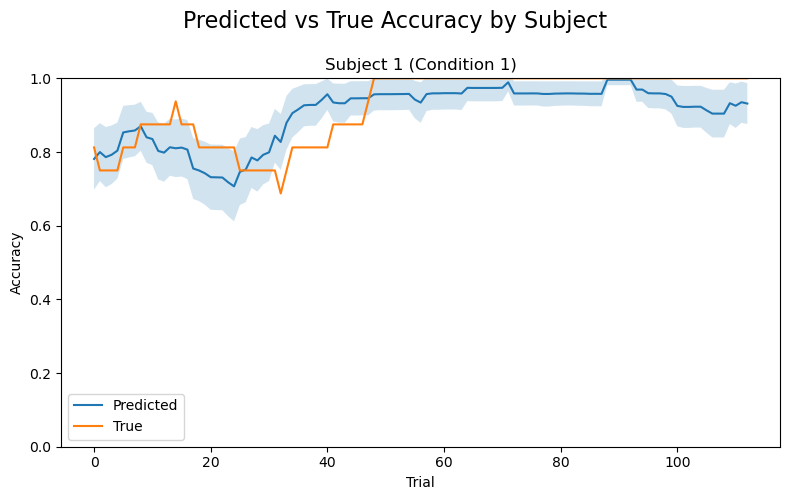

In [ ]:
model_eval.plot_accuracy_comparison(prediction, [iSub])

In [ ]:
from src.Bayesian.utils.oral_process import Oral_to_coordinate
oral_to_coordinate = Oral_to_coordinate()

learning_data = pd.read_csv(processed_path / 'Task2_processed.csv')
oral_hypo_hits = oral_to_coordinate.get_oral_hypo_hits(learning_data)

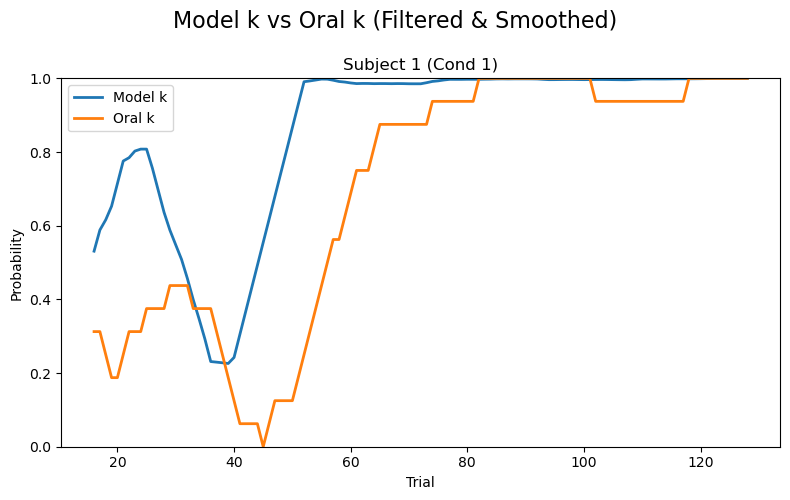

In [ ]:
model_eval.plot_k_oral_comparison(results, oral_hypo_hits, [iSub])

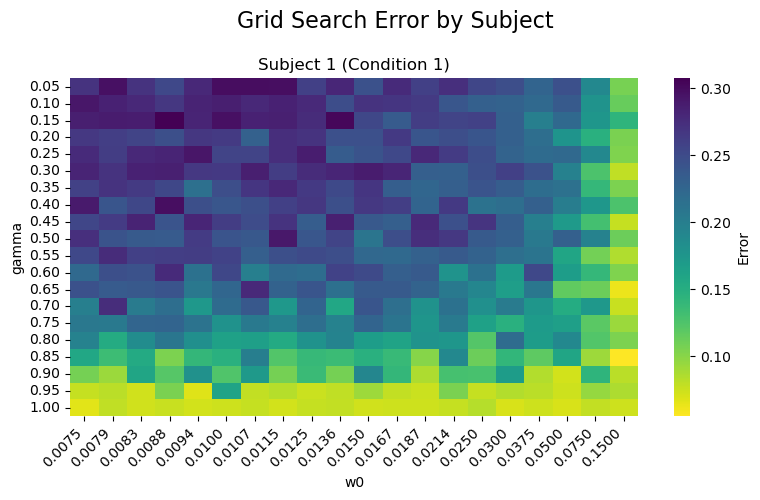

In [ ]:
model_eval.plot_error_grids(results, fname=['gamma','w0'])

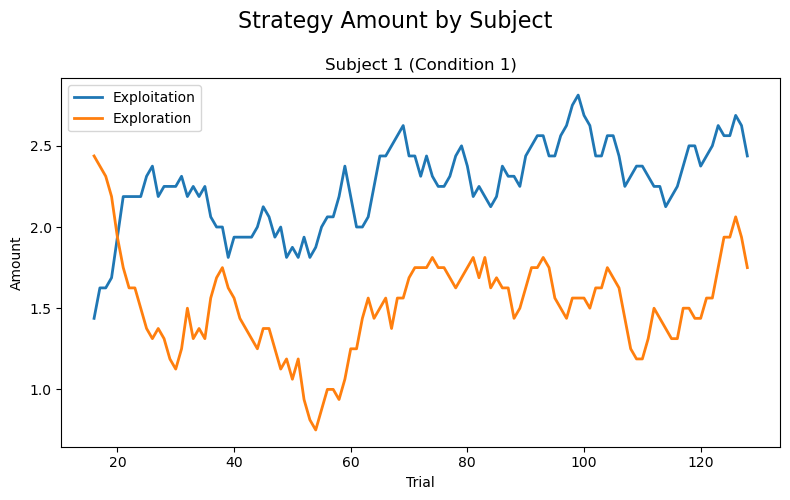

In [ ]:
model_eval.plot_cluster_amount(results, 16, [iSub])

In [ ]:
result_path = Path(project_root) / 'results' / 'Model_results' 
results = joblib.load(result_path / f'M7_PMH.joblib')

In [ ]:
import numpy as np
from scipy.stats import pearsonr

# 获取每个被试的gamma和w0
gammas = []
w0s = []
trial_counts = []

for sub_id, res in results.items():
    best_params = res['best_params']
    gamma = best_params.get('gamma')
    w0 = best_params.get('w0')
    gammas.append(gamma)
    w0s.append(w0)

    # 统计每个被试的总试次数
    trial_count = len(res['best_step_results'])
    trial_counts.append(trial_count)

# gamma与总试次数相关
gamma_corr, gamma_p = pearsonr(gammas, trial_counts)
print(f"gamma与总试次数相关系数: {gamma_corr:.4f}, p值: {gamma_p:.4g}")

# w0与总试次数相关
w0_corr, w0_p = pearsonr(w0s, trial_counts)
print(f"w0与总试次数相关系数: {w0_corr:.4f}, p值: {w0_p:.4g}")

gamma与总试次数相关系数: -0.3423, p值: 0.1016
w0与总试次数相关系数: -0.4859, p值: 0.01608


In [ ]:
import numpy as np
from scipy.stats import pearsonr

# 获取每个被试的gamma和w0
gammas = []
w0s = []
trial_counts = []
conditions = []

for sub_id, res in results.items():
    best_params = res['best_params']
    gamma = best_params.get('gamma')
    w0 = best_params.get('w0')
    gammas.append(gamma)
    w0s.append(w0)

    # 统计每个被试的总试次数
    trial_count = len(res['best_step_results'])
    trial_counts.append(trial_count)

    # 记录每个被试的condition
    conditions.append(res['condition'])

# 转为numpy数组
trial_counts = np.array(trial_counts)
conditions = np.array(conditions)
trial_counts_norm = np.zeros_like(trial_counts, dtype=float)

# 按照每个condition归一化试次数
for cond in np.unique(conditions):
    idx = np.where(conditions == cond)[0]
    max_count = trial_counts[idx].max()
    trial_counts_norm[idx] = trial_counts[idx] / max_count if max_count > 0 else 0

# gamma与归一化试次数相关
gamma_corr, gamma_p = pearsonr(gammas, trial_counts_norm)
print(f"gamma与归一化试次数相关系数: {gamma_corr:.4f}, p值: {gamma_p:.4g}")

# w0与归一化试次数相关
w0_corr, w0_p = pearsonr(w0s, trial_counts_norm)
print(f"w0与归一化试次数相关系数: {w0_corr:.4f}, p值: {w0_p:.4g}")
